In [1]:
!git clone https://github.com/grichali/track

Cloning into 'track'...
remote: Enumerating objects: 16320, done.
remote: Counting objects: 100% (3308/3308), done.
remote: Compressing objects: 100% (3308/3308), done.
remote: Total 16320 (delta 0), reused 3308 (delta 0), pack-reused 13012
Receiving objects: 100% (16320/16320), 215.47 MiB | 19.18 MiB/s, done.
Updating files: 100% (16313/16313), done.


In [2]:
!ls track

driving_log.csv  IMG  test


In [3]:
import numpy as np
import matplotlib.pyplot as plt
import keras
from keras.layers import Dropout, Flatten,Convolution2D, MaxPooling2D, Dense
from keras.optimizers import Adam
from keras.models import Sequential
import cv2
import pandas as pd
import random
from imgaug import augmenters as iaa
import matplotlib.image as mpimg

In [4]:
import os
datadir = 'track'
columns = ['center', 'left', 'right','steering', 'throttle', 'reverse', 'speed']
data = pd.read_csv(os.path.join(datadir,'driving_log.csv'), names=columns)
data.head()

,center,left,right,steering,throttle,reverse,speed
0,C:\Users\ali\Desktop\S4\ai\Self-Driving\datase...,C:\Users\ali\Desktop\S4\ai\Self-Driving\datas...,C:\Users\ali\Desktop\S4\ai\Self-Driving\datas...,0.0,0.160566,0,0.100447
1,C:\Users\ali\Desktop\S4\ai\Self-Driving\datase...,C:\Users\ali\Desktop\S4\ai\Self-Driving\datas...,C:\Users\ali\Desktop\S4\ai\Self-Driving\datas...,0.0,0.534135,0,0.802117
2,C:\Users\ali\Desktop\S4\ai\Self-Driving\datase...,C:\Users\ali\Desktop\S4\ai\Self-Driving\datas...,C:\Users\ali\Desktop\S4\ai\Self-Driving\datas...,0.0,0.880380,0,1.849120
3,C:\Users\ali\Desktop\S4\ai\Self-Driving\datase...,C:\Users\ali\Desktop\S4\ai\Self-Driving\datas...,C:\Users\ali\Desktop\S4\ai\Self-Driving\datas...,0.0,1.000000,0,3.037374
4,C:\Users\ali\Desktop\S4\ai\Self-Driving\datase...,C:\Users\ali\Desktop\S4\ai\Self-Driving\datas...,C:\Users\ali\Desktop\S4\ai\Self-Driving\datas...,0.0,1.000000,0,4.676245


In [5]:
import ntpath
def path_leaf(path):
  head, tail = ntpath.split(path)
  return tail

data['center'] = data['center'].apply(path_leaf)
data.head()

,center,left,right,steering,throttle,reverse,speed
0,center_2024_03_26_01_13_47_552.jpg,C:\Users\ali\Desktop\S4\ai\Self-Driving\datas...,C:\Users\ali\Desktop\S4\ai\Self-Driving\datas...,0.0,0.160566,0,0.100447
1,center_2024_03_26_01_13_47_673.jpg,C:\Users\ali\Desktop\S4\ai\Self-Driving\datas...,C:\Users\ali\Desktop\S4\ai\Self-Driving\datas...,0.0,0.534135,0,0.802117
2,center_2024_03_26_01_13_47_798.jpg,C:\Users\ali\Desktop\S4\ai\Self-Driving\datas...,C:\Users\ali\Desktop\S4\ai\Self-Driving\datas...,0.0,0.880380,0,1.849120
3,center_2024_03_26_01_13_47_902.jpg,C:\Users\ali\Desktop\S4\ai\Self-Driving\datas...,C:\Users\ali\Desktop\S4\ai\Self-Driving\datas...,0.0,1.000000,0,3.037374
4,center_2024_03_26_01_13_48_026.jpg,C:\Users\ali\Desktop\S4\ai\Self-Driving\datas...,C:\Users\ali\Desktop\S4\ai\Self-Driving\datas...,0.0,1.000000,0,4.676245


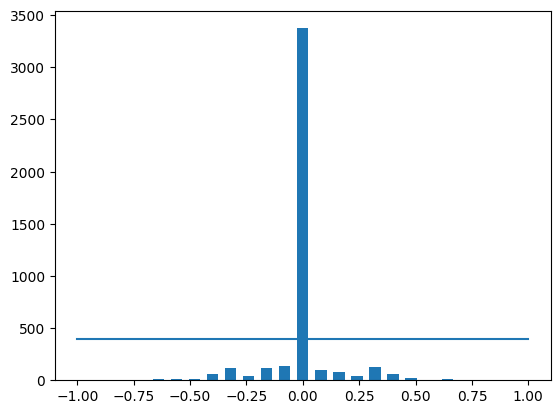

In [6]:
num_bins = 25
samples_per_bin = 400
hist, bins = np.histogram(data['steering'], num_bins)
center = (bins[:-1] + bins[1:]) * 0.5
plt.bar(center, hist, width=0.05)
plt.plot((np.min(data['steering']),np.max(data['steering'])),(samples_per_bin,samples_per_bin) )

total data: 4336
 removed:  2973
remaining: 1363


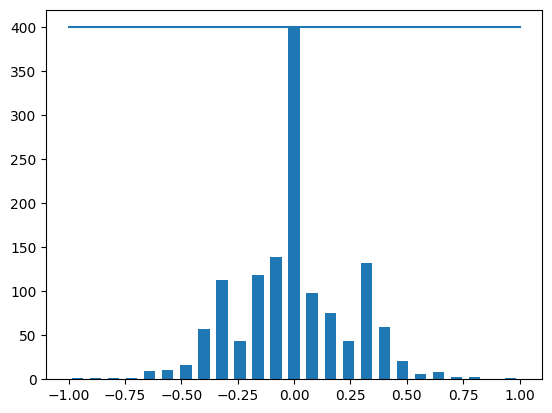

In [7]:
from sklearn.utils import shuffle
print( 'total data:', len(data) )
remove_list = []
for j in range (num_bins):
  list_= []
  for i in range(len(data['steering'])):
    if data['steering'][i] >= bins[j] and data['steering'][i] <= bins[j+1] :
      list_.append(i)
  list_ = shuffle(list_)
  list_ = list_[samples_per_bin:]
  remove_list.extend(list_)


print (' removed: ',len (remove_list))
data.drop(data.index[remove_list], inplace=True)
print( 'remaining:',len(data))
hist, _ = np.histogram(data['steering'], (num_bins))
plt.bar (center, hist, width=0.05)
plt.plot((np.min(data['steering']), np.max(data['steering'])), (samples_per_bin, samples_per_bin))

In [8]:
print(data.iloc[1])
def load_img_steering(datadir, df):
  image_path = []
  steering = []
  for i in range(len(data)):
    indexed_data = data.iloc[i]
    center = indexed_data[0]
    image_path.append(os.path.join(datadir, center.strip()))
    steering.append(float(indexed_data[3]))
  image_paths = np.asarray(image_path)
  steerings = np.asarray(steering)
  return image_paths, steerings

image_paths, steerings = load_img_steering(datadir + '/IMG', data)

center                     center_2024_03_26_01_13_48_263.jpg
left         C:\Users\ali\Desktop\S4\ai\Self-Driving\datas...
right        C:\Users\ali\Desktop\S4\ai\Self-Driving\datas...
steering                                            -0.188601
throttle                                                  1.0
reverse                                                     0
speed                                                7.204012
Name: 6, dtype: object


In [9]:
print(image_paths)

['track/IMG/center_2024_03_26_01_13_47_552.jpg'
 'track/IMG/center_2024_03_26_01_13_48_263.jpg'
 'track/IMG/center_2024_03_26_01_13_48_379.jpg' ...
 'track/IMG/center_2024_03_26_01_22_15_622.jpg'
 'track/IMG/center_2024_03_26_01_22_17_653.jpg'
 'track/IMG/center_2024_03_26_01_22_17_868.jpg']


In [10]:
from sklearn.model_selection import train_test_split

X_train, X_valid, y_train, y_valid = train_test_split(image_paths, steerings, test_size=0.3, random_state=42)

In [11]:
print("X_train:")
print(X_train)

print("\ny_train:")
print(y_train)


X_train:
['track/IMG/center_2024_03_26_01_19_46_383.jpg'
 'track/IMG/center_2024_03_26_01_16_44_731.jpg'
 'track/IMG/center_2024_03_26_01_15_41_045.jpg'
 'track/IMG/center_2024_03_26_01_20_30_860.jpg'
 'track/IMG/center_2024_03_26_01_15_36_813.jpg'
 'track/IMG/center_2024_03_26_01_20_31_203.jpg'
 'track/IMG/center_2024_03_26_01_14_23_249.jpg'
 'track/IMG/center_2024_03_26_01_14_38_606.jpg'
 'track/IMG/center_2024_03_26_01_18_57_347.jpg'
 'track/IMG/center_2024_03_26_01_13_50_308.jpg'
 'track/IMG/center_2024_03_26_01_19_16_563.jpg'
 'track/IMG/center_2024_03_26_01_14_53_556.jpg'
 'track/IMG/center_2024_03_26_01_17_20_548.jpg'
 'track/IMG/center_2024_03_26_01_21_45_210.jpg'
 'track/IMG/center_2024_03_26_01_15_15_908.jpg'
 'track/IMG/center_2024_03_26_01_18_06_840.jpg'
 'track/IMG/center_2024_03_26_01_19_56_659.jpg'
 'track/IMG/center_2024_03_26_01_22_09_362.jpg'
 'track/IMG/center_2024_03_26_01_22_13_926.jpg'
 'track/IMG/center_2024_03_26_01_18_44_760.jpg'
 'track/IMG/center_2024_03_26_0

In [12]:
def img_zoom(image):
  zoom = iaa.Affine(scale=(1,1.3))
  image = zoom.augment_image(image)
  return image

In [13]:
def img_pan(image):
  pan = iaa.Affine(translate_percent={"x": (-0.1,0.1), "y":(-0.1,0.1)})
  image = pan.augment_image(image)
  return image

In [14]:
def img_random_brightness(image):
  brightness = iaa.Multiply((0.2,1.2))
  image = brightness.augment_image(image)
  return image

In [15]:
def img_flip(image, steering_angle):
  image = cv2.flip(image,1)
  steering_angle = -steering_angle
  return image, steering_angle

Text(0.5, 1.0, 'fliped image, new steering angle = 0.385284')

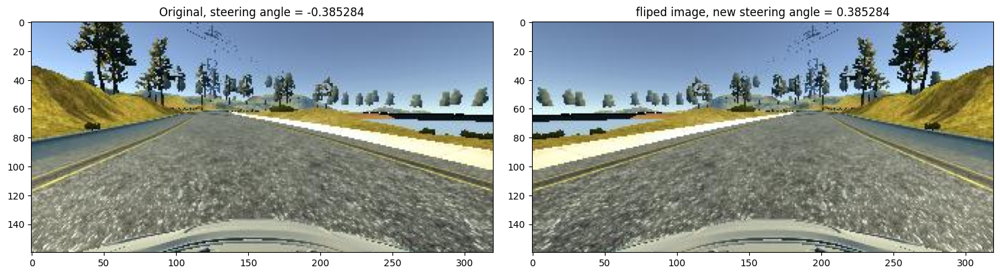

In [16]:
nbr = random.randint(0,1000)
image = X_train[nbr]
steering_angle = y_train[nbr]
original_image = mpimg.imread(image)
new_image, new_steering_angle = img_flip(original_image,steering_angle)

fig, axs = plt.subplots(1,2, figsize=(15,10))
fig.tight_layout()
axs[0].imshow(original_image)
axs[0].set_title('Original, ' + 'steering angle = '+ str(steering_angle))

axs[1].imshow(new_image)
axs[1].set_title('fliped image, '+ 'new steering angle = '+ str(new_steering_angle))

Text(0.5, 1.0, 'pan')

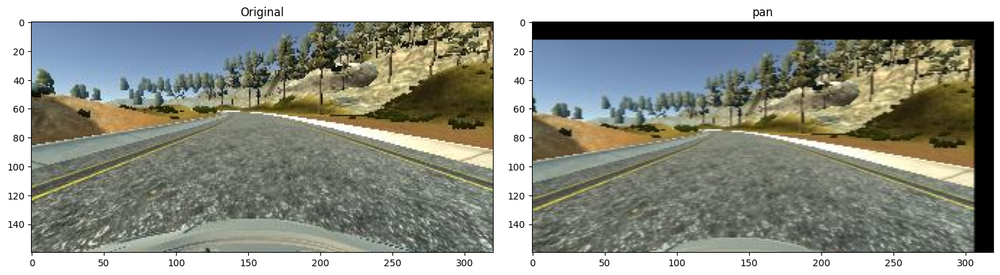

In [17]:
image = X_train[209]
original_image = mpimg.imread(image)
new_image = img_pan(original_image)

fig, axs = plt.subplots(1,2, figsize=(15,10))
fig.tight_layout()
axs[0].imshow(original_image)
axs[0].set_title('Original')

axs[1].imshow(new_image)
axs[1].set_title('pan')

In [18]:
def random_augmentation(image, steering_angle):
    img = mpimg.imread(image)
    if np.random.rand() < 0.5:
        img, steering_angle = img_flip(img, steering_angle)
    if np.random.rand() < 0.5:
        img = img_random_brightness(img)
    if np.random.rand() < 0.5:
        img = img_pan(img)
    if np.random.rand() < 0.5:
        img = img_zoom(img)
    return img, steering_angle


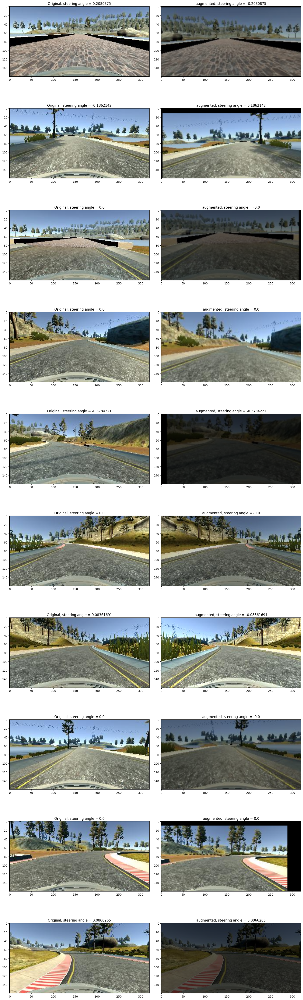

In [19]:
ncol = 2
nrow = 10
fig, axs = plt.subplots(nrow , ncol, figsize=(15,50))
fig.tight_layout()
for i in range(10):
  randnum = random.randint(0, len(X_train)-1)
  random_image = X_train[randnum]
  random_steering = y_train[randnum]

  original_image = mpimg.imread(random_image)
  augmented_image, steering_angle = random_augmentation(random_image, random_steering)
  axs[i][0].imshow(original_image)
  axs[i][0].set_title('Original, ' + 'steering angle = '+ str(random_steering))

  axs[i][1].imshow(augmented_image)
  axs[i][1].set_title('augmented, '+ 'steering angle = '+ str(steering_angle))


In [20]:
def img_preprocess(img):
  img = img[ 60:135, : , : ]
  img = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
  img = cv2.GaussianBlur(img, [3,3], 0)
  img = cv2.resize(img, (200,66))
  img = img/255
  return img

Text(0.5, 1.0, 'Preprocessed')

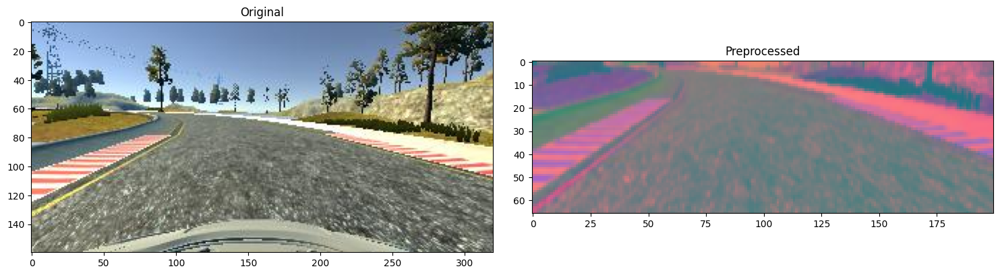

In [21]:
image = image_paths[100]
original_image = mpimg.imread(image)
preprocessed_image = img_preprocess(original_image)

fig, axs = plt.subplots(1,2, figsize=(15,10))
fig.tight_layout()
axs[0].imshow(original_image)
axs[0].set_title('Original')

axs[1].imshow(preprocessed_image)
axs[1].set_title('Preprocessed')

In [22]:
def batch_generator(image_paths, steering_angles, batch_size, istraining):
  while True:
    batch_img = []
    batch_steering = []

    for i in range(batch_size):
      random_index = random.randint(0, len(image_paths) - 1)
      if istraining:
        img, steering = random_augmentation(image_paths[random_index], steering_angles[random_index])
      else:
        img = mpimg.imread(image_paths[random_index])
        steering = steering_angles[random_index]

      img = img_preprocess(img)
      batch_img.append(img)
      batch_steering.append(steering)
    yield (np.asarray(batch_img), np.asarray(batch_steering))

In [23]:
def nvidia_model():
    model = Sequential()
    model.add(Convolution2D(24, (5, 5), strides=(2, 2), input_shape=(66, 200, 3), activation='elu'))
    model.add(Convolution2D(36, (5, 5), strides=(2, 2), activation='elu'))
    model.add(Convolution2D(48, (5, 5), strides=(2, 2), activation='elu'))
    model.add(Convolution2D(64, (3, 3), activation='elu'))
    model.add(Convolution2D(64, (3, 3), activation='elu'))

    model.add(Flatten())
    model.add(Dense(100, activation='elu'))

    model.add(Dense(50, activation='elu'))

    model.add(Dense(10, activation='elu'))

    model.add(Dense(1))

    optimizer = Adam(learning_rate=1e-4)
    model.compile(loss='mean_squared_error', optimizer=optimizer)
    return model


In [24]:
model = nvidia_model()
print(model.summary() )

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 31, 98, 24)        1824      
                                                                 
 conv2d_1 (Conv2D)           (None, 14, 47, 36)        21636     
                                                                 
 conv2d_2 (Conv2D)           (None, 5, 22, 48)         43248     
                                                                 
 conv2d_3 (Conv2D)           (None, 3, 20, 64)         27712     
                                                                 
 conv2d_4 (Conv2D)           (None, 1, 18, 64)         36928     
                                                                 
 flatten (Flatten)           (None, 1152)              0         
                                                                 
 dense (Dense)               (None, 100)               1

In [25]:
from keras.callbacks import EarlyStopping

early_stopping = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)

history = model.fit_generator(batch_generator(X_train, y_train, batch_size=100, istraining=1),
                              steps_per_epoch=200,
                              epochs=10,
                              validation_data=batch_generator(X_valid, y_valid, 100, 0),
                              validation_steps=100,
                              callbacks=[early_stopping],
                              verbose=1,
                              shuffle=1)


<ipython-input-25-ccee1dfa702a>:5: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = model.fit_generator(batch_generator(X_train, y_train, batch_size=100, istraining=1),


Epoch 1/10
200/200 [==============================] - 80s 362ms/step - loss: 0.0547 - val_loss: 0.0481
Epoch 2/10
200/200 [==============================] - 71s 356ms/step - loss: 0.0436 - val_loss: 0.0472
Epoch 3/10
200/200 [==============================] - 77s 386ms/step - loss: 0.0427 - val_loss: 0.0446
Epoch 4/10
200/200 [==============================] - 72s 361ms/step - loss: 0.0413 - val_loss: 0.0425
Epoch 5/10
200/200 [==============================] - 74s 371ms/step - loss: 0.0406 - val_loss: 0.0426
Epoch 6/10
200/200 [==============================] - 76s 380ms/step - loss: 0.0381 - val_loss: 0.0407
Epoch 7/10
200/200 [==============================] - 81s 406ms/step - loss: 0.0375 - val_loss: 0.0390
Epoch 8/10
200/200 [==============================] - 67s 334ms/step - loss: 0.0364 - val_loss: 0.0389
Epoch 9/10
200/200 [==============================] - 81s 406ms/step - loss: 0.0338 - val_loss: 0.0352
Epoch 10/10
200/200 [==============================] - 55s 275ms/step - l

In [26]:
history.history ['val_loss']

[0.048114292323589325,
 0.047152381390333176,
 0.04459406062960625,
 0.04246589541435242,
 0.042616765946149826,
 0.040677592158317566,
 0.039044853299856186,
 0.0388931930065155,
 0.03515609726309776,
 0.03488580882549286]

In [27]:
history.history['loss']

[0.05467226728796959,
 0.04361400008201599,
 0.04270244017243385,
 0.04128248617053032,
 0.040570218116045,
 0.038054365664720535,
 0.03749478980898857,
 0.036394525319337845,
 0.0337793193757534,
 0.032860077917575836]

Text(0.5, 1.0, 'loss')

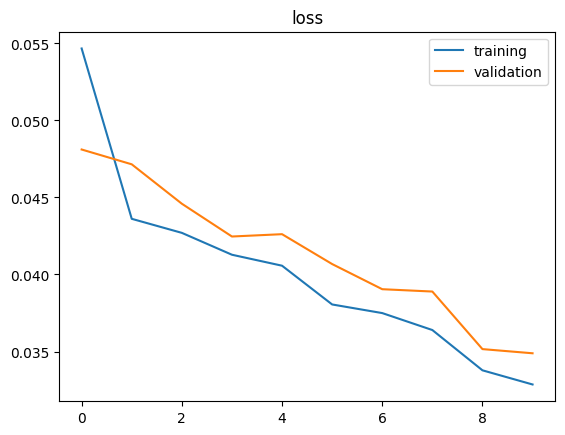

In [28]:
plt.plot(history.history['loss'])
plt.plot(history.history ['val_loss'])
plt.legend(['training', 'validation'])
plt.title('loss')

In [29]:
model.save("tillnow.h5")

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(
